# Лабораторная 6

## Задание

### Предобученные модели детекции, такие как Mask R-CNN детектируют и сегментируют объекты фиксированных классов, в том числе знаки “Стоп”
### Предлагается обучить выбранную модель сегментировать 8 типов знаков на наборе данных Russian road signs https://www.kaggle.com/datasets/viacheslavshalamov/russian-road-signs-segmentation-dataset, содержащем 100000 изображений дорожных знаков России

#### Приложенный датасет оказался размеченным под другую задачу (сегментирование объектов (автомобили,грузовики, пешеходы и т.д.)), после цикла обучения я вывел фото того что размечено

In [2]:
from ultralytics import YOLO
import torch
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"{device}")

cuda


In [3]:
model = YOLO('yolov8n-seg.pt')
results = model.train(
    data='yolo_dataset/data.yaml',
    epochs=30,
    imgsz=640,
    batch=16,
    name='yolov8_seg'
)

New https://pypi.org/project/ultralytics/8.4.36 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.32  Python-3.13.5 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3070 Ti Laptop GPU, 8192MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=yolo_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.

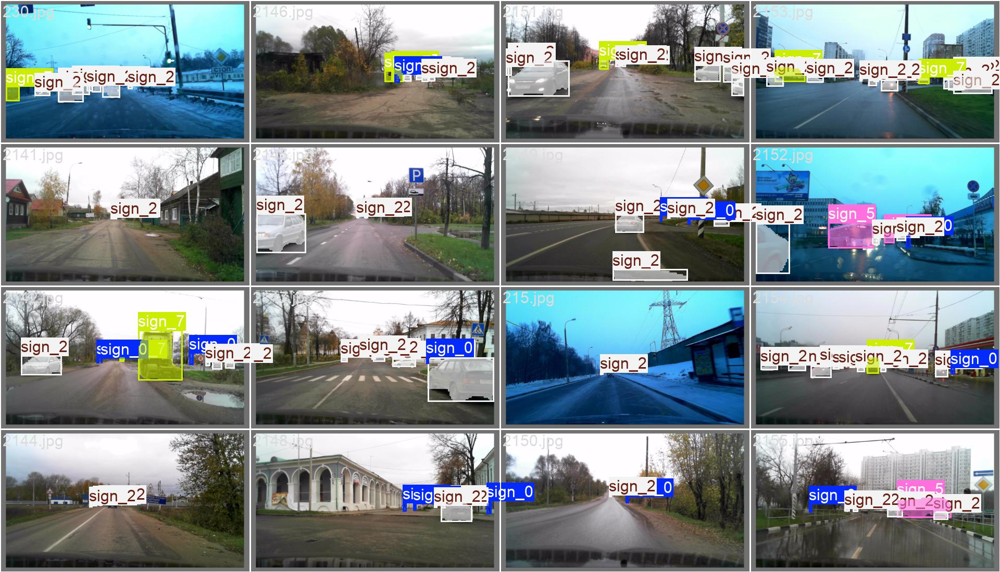

In [4]:
from PIL import Image
img = Image.open('runs/segment/yolov8_seg/val_batch2_labels.jpg')
img

#### В качестве более подходящей альтернативы я нашел другой датасет (https://www.kaggle.com/datasets/bogdanliutikov/russian-road-signs-segmentation-dataset), он основан на том же самом изначальном датасете, но его проблема в том, что в нем знаки размечены как единый класс

In [4]:
model2 = YOLO('yolov8n-seg.pt')
results2 = model2.train(
    data='dataset/data.yaml',
    epochs=30,
    imgsz=640,
    batch=16,
    name='yolov8_seg2'
)

New https://pypi.org/project/ultralytics/8.4.36 available  Update with 'pip install -U ultralytics'
Ultralytics 8.4.32  Python-3.13.5 torch-2.7.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3070 Ti Laptop GPU, 8192MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, na

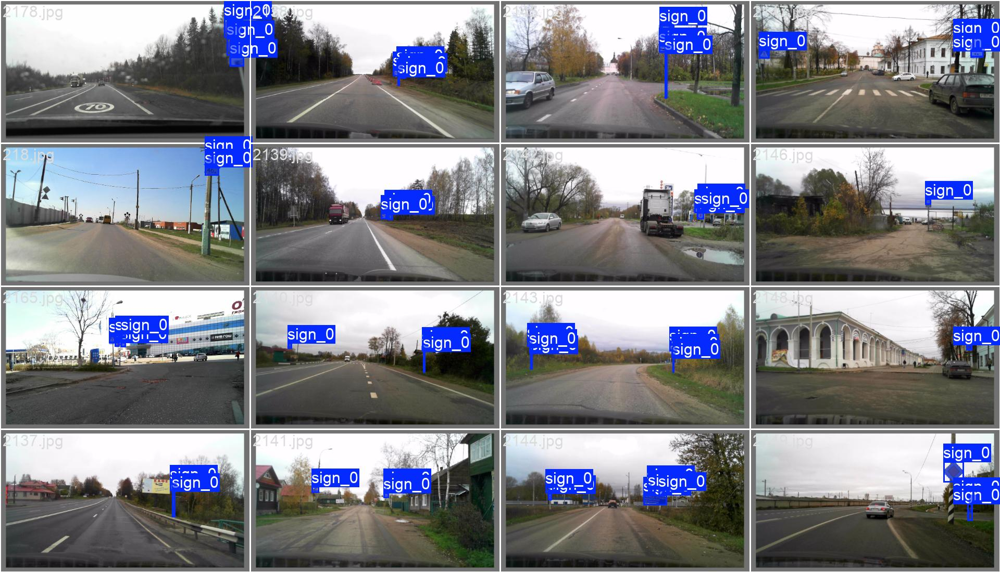

In [30]:
from PIL import Image
img = Image.open('runs/segment/yolov8_seg2/val_batch2_labels.jpg')
img

### Оценка качества сегментации производится с помощью метрик IoU, Precision, Recall, L2 отдельно на валидационной части набора изображений Russian road signs и сделанных фотографиях, также интересует процент изображений, на котором IoU >= 0.5, IoU >= 0.75, IoU >= 0.9

In [27]:
def get_mask(path, w, h):
    mask= np.zeros((h, w), dtype=np.uint8)
    if not os.path.exists(path): return mask

    with open(path, 'r') as f:
        for line in f:
            d =[float(x) for x in line.strip().split() if x]
            if len(d)< 5:
                continue
            p = np.array(d[1:], dtype=np.float32).reshape(-1, 2)
            p[:, 0],p[:, 1] =p[:, 0] * w,p[:, 1]* h
            cv2.fillPoly(mask,[p.astype(np.int32)], 1)
    return mask

def run_eval(weights,img_dir,lbl_dir):
    model= YOLO(weights)
    files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

    stats = []
    for name in files:
        im_path= os.path.join(img_dir, name)
        lb_path= os.path.join(lbl_dir, name.rsplit('.', 1)[0] + '.txt')

        img = cv2.imread(im_path)
        if img is None:
            continue
        h,w = img.shape[:2]

        gt= get_mask(lb_path, w, h)
        pred =np.zeros((h, w), dtype=np.uint8)

        res =model.predict(im_path, verbose=False)[0]
        if res.masks is not None:
            for m in res.masks.xy:
                if len(m)> 0:
                    cv2.fillPoly(pred,[m.astype(np.int32)], 1)

        inter =np.logical_and(gt, pred).sum()
        uni= np.logical_or(gt, pred).sum()

        if uni== 0:
            iou = prec= rec = 1.0
        else:
            iou= inter/uni
            tp= inter
            prec =tp /pred.sum() if pred.sum()> 0 else 0
            rec = tp /gt.sum() if gt.sum()> 0 else 0

        l2 = np.sqrt(np.sum((gt.astype(float) - pred.astype(float))**2)) / (w * h)
        stats.append({'iou':iou,'prec': prec,'rec': rec,'l2': l2})

    if not stats:
        return None

    n= len(stats)
    m_iou= sum(s['iou'] for s in stats) /n
    m_prec= sum(s['prec'] for s in stats) /n
    m_rec = sum(s['rec'] for s in stats) /n
    m_l2 =sum(s['l2'] for s in stats) /n
    i50 =len([s for s in stats if s['iou']>= 0.5]) /n* 100
    i75 =len([s for s in stats if s['iou']>= 0.75]) /n* 100
    i90 =len([s for s in stats if s['iou']>= 0.9]) /n* 100

    print(f"Mean IoU: {m_iou:.4f} | Prec: {m_prec:.4f} | Rec: {m_rec:.4f}")
    print(f"IoU > 0.5: {i50:.2f}% | IoU > 0.75: {i75:.2f}% | IoU > 0.9: {i90:.2f}% | L2: {m_l2:.6f}")

    return None

#### Оценка на валидационной части датасета

In [28]:
metrics_val = run_eval(
    weights='runs/segment/yolov8_seg2/weights/best.pt',
    img_dir='dataset/images/val',
    lbl_dir='dataset/labels/val'
)

Mean IoU: 0.6214 | Prec: 0.7187 | Rec: 0.8362
IoU > 0.5: 78.74% | IoU > 0.75: 23.62% | IoU > 0.9: 0.79% | L2: 0.000049


#### Оценка на самостоятельно размеченных фото

In [32]:
metrics_val = run_eval(
    weights='runs/segment/yolov8_seg2/weights/best.pt',
    img_dir='my_labeled_photos/train/images',
    lbl_dir='my_labeled_photos/train/labels'
)

Mean IoU: 0.3772 | Prec: 0.5848 | Rec: 0.4837
IoU > 0.5: 40.00% | IoU > 0.75: 20.00% | IoU > 0.9: 0.00% | L2: 0.000100


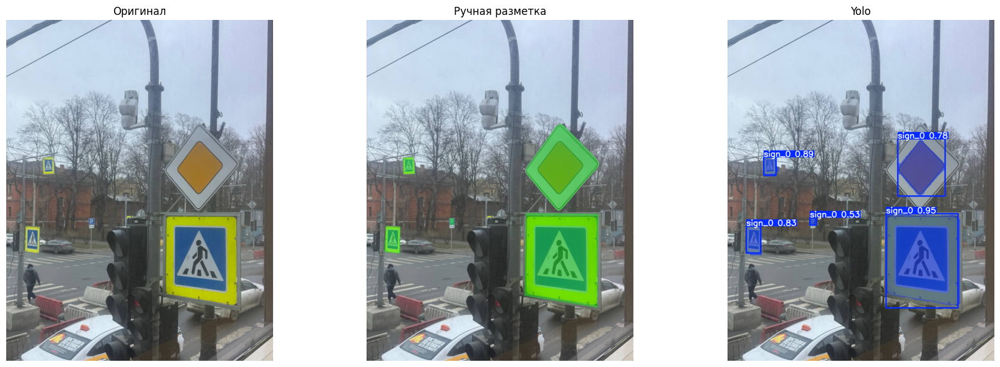

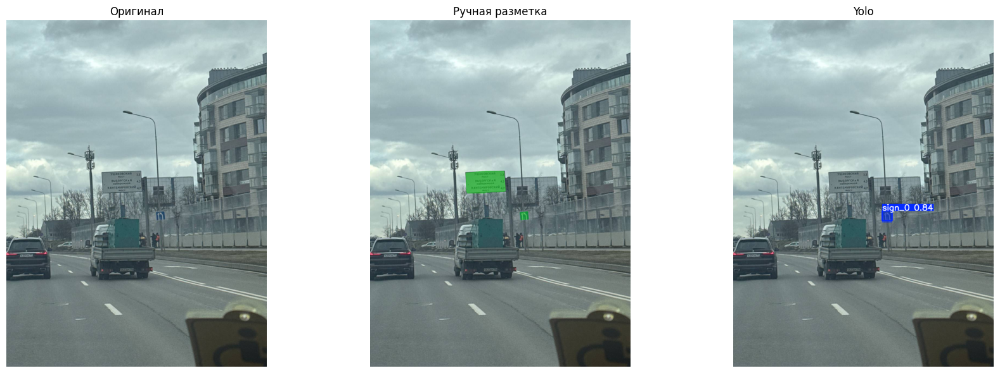

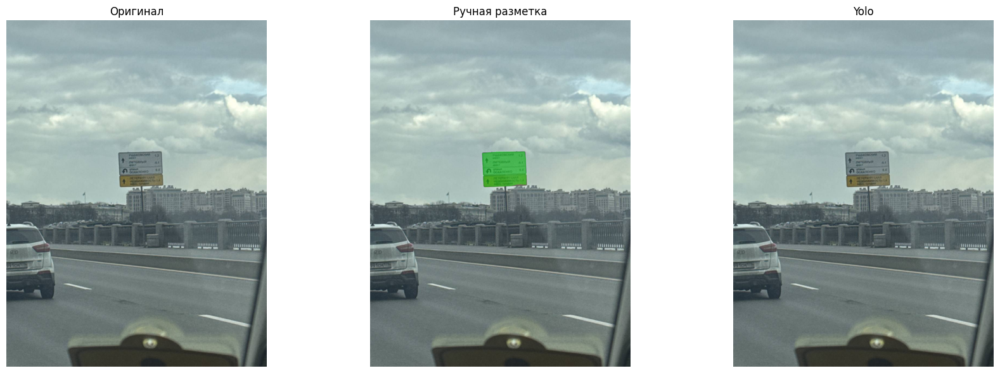

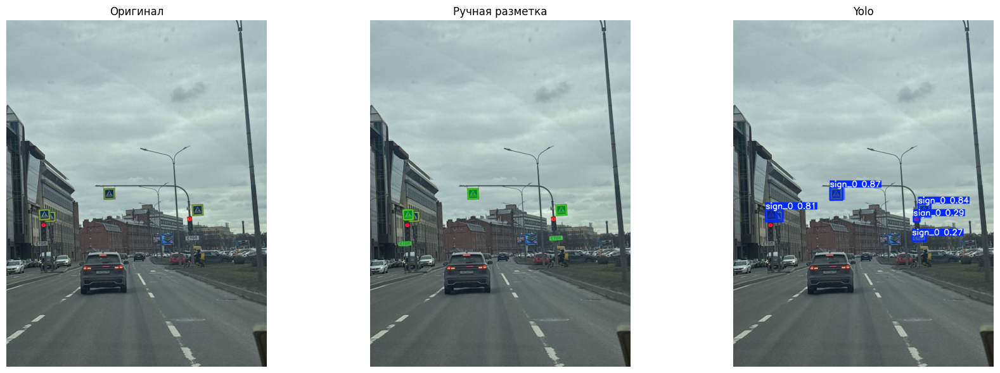

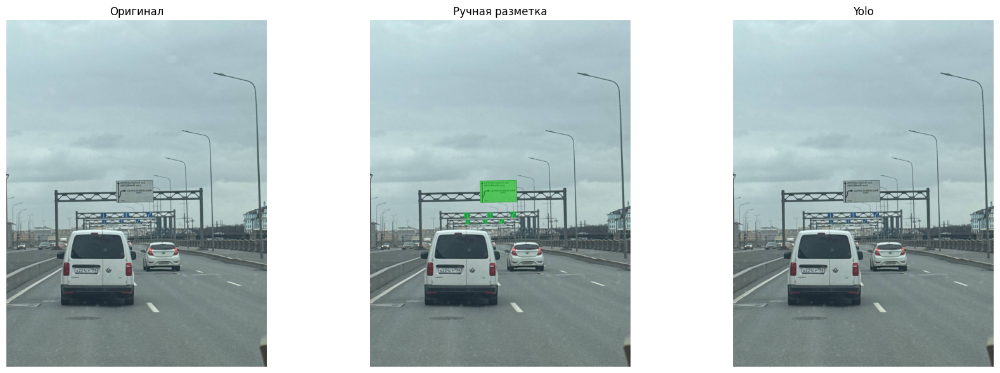

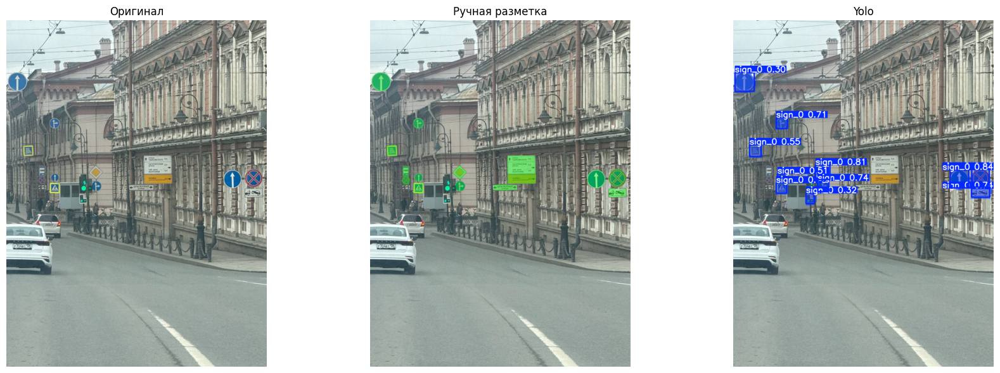

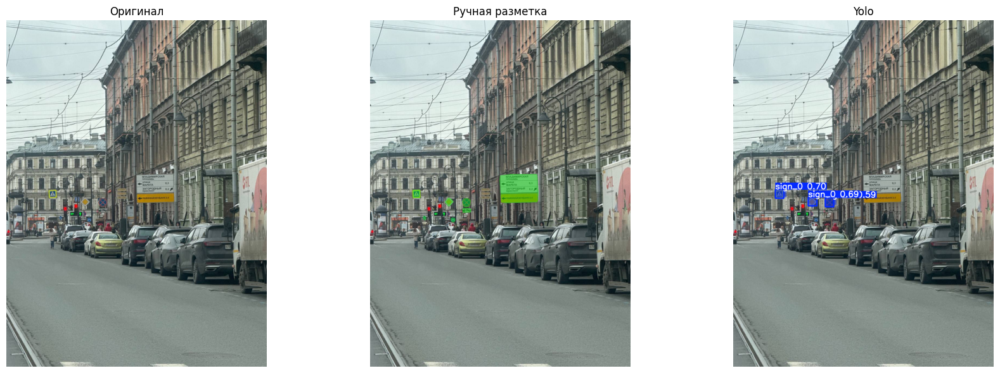

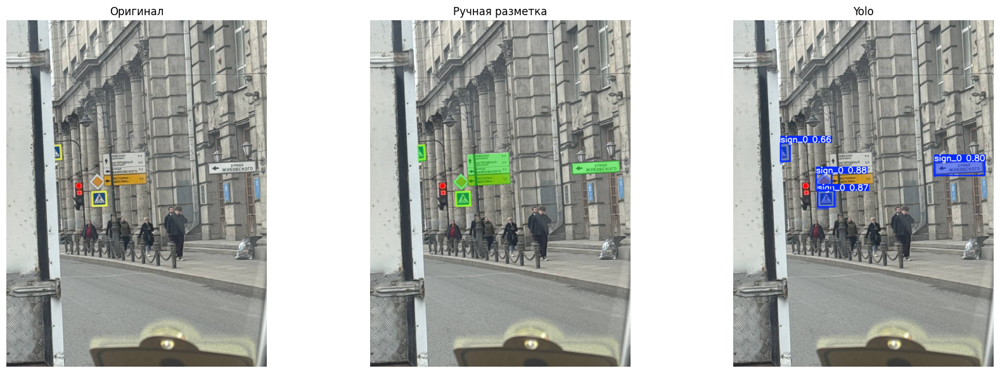

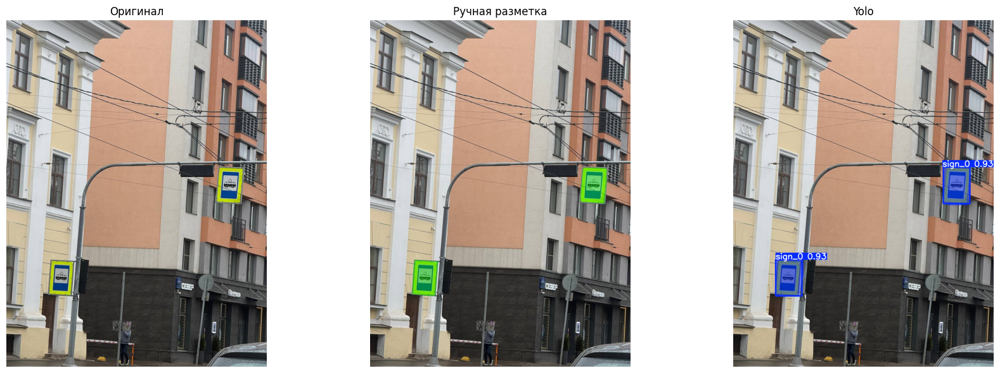

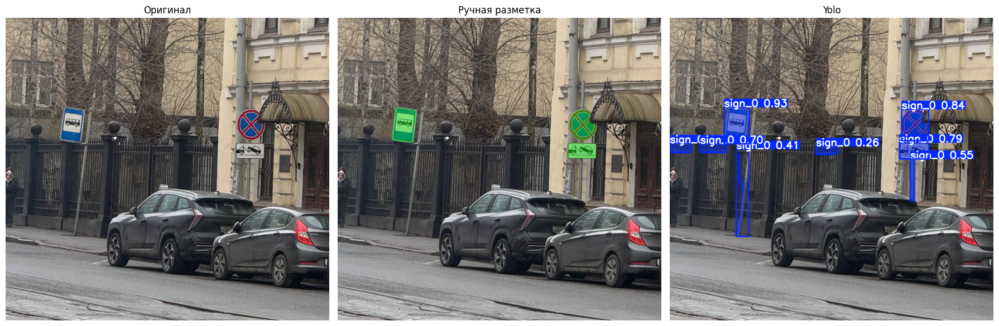

In [33]:
%matplotlib inline
img_dir= 'my_labeled_photos/train/images'
lbl_dir= 'my_labeled_photos/train/labels'
weights= 'runs/segment/yolov8_seg2/weights/best.pt'
model= YOLO(weights)
files =sorted([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg'))])

for name in files:
    im_path= os.path.join(img_dir, name)
    gt_path =os.path.join(lbl_dir,name.rsplit('.', 1)[0]+ '.txt')
    src= cv2.imread(im_path)

    if src is None:
        continue
    fig,ax =plt.subplots(1,3,figsize=(18, 6))
    ax[0].imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
    ax[0].set_title(f"Оригинал")
    ax[0].axis('off')
    h,w = src.shape[:2]
    overlay = src.copy()
    if os.path.exists(gt_path):
        with open(gt_path,'r') as f:
            for line in f:
                data= [x for x in line.strip().split() if x]
                if len(data)< 3:
                    continue

                cords= np.array(data[1:],dtype=np.float32)
                if len(cords)% 2!= 0:
                    cords =cords[:-1]
                p =cords.reshape(-1, 2)
                p[:, 0]*= w
                p[:, 1] *= h
                cv2.fillPoly(overlay,[p.astype(np.int32)], (0, 255, 0))

    gt_viz = cv2.addWeighted(overlay, 0.4, src, 0.6, 0)
    ax[1].imshow(cv2.cvtColor(gt_viz, cv2.COLOR_BGR2RGB))
    ax[1].set_title("Ручная разметка")
    ax[1].axis('off')

    res= model.predict(im_path, verbose=False)[0]
    pred = res.plot()

    if pred is not None:
        ax[2].imshow(cv2.cvtColor(pred, cv2.COLOR_BGR2RGB))
    else:
        ax[2].text(0.5, 0.5,'Empty', ha='center')

    ax[2].set_title("Yolo")
    ax[2].axis('off')

    plt.tight_layout()
    plt.show()